In [7]:
import numpy as np  # 科学计算工具包
import pandas as pd  # 数据分析工具包
import matplotlib.pyplot as plt # 图表绘制工具包
import seaborn as sns # 基于 matplot, 导入 seaborn 会修改默认的 matplotlib 配色方案和绘图样式，这会提高图表的可读性和美观性
import os
from scipy import stats
from scipy.stats import norm, skew 

plt.rc("font",family="SimHei",size="15")  #解决中文乱码问题

# 在 jupyter notebook 里面显示图表
%matplotlib inline 

In [54]:
train_data = pd.read_csv(r"../data/house-prices-advanced-regression-techniques/train.csv")
train_data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000


In [56]:
test_data = pd.read_csv(r"../data/house-prices-advanced-regression-techniques/test.csv")
test_data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal
5,1466,60,RL,75.0,10000,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal
6,1467,20,RL,NaN,7980,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,GdPrv,Shed,500,3,2010,WD,Normal
7,1468,60,RL,63.0,8402,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal
8,1469,20,RL,85.0,10176,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,2,2010,WD,Normal
9,1470,20,RL,70.0,8400,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,4,2010,WD,Normal


In [34]:
df_train['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

In [57]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [58]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

In [94]:
train = train_data.drop("SalePrice",axis = 1)
all_data= pd.concat((train, test_data)).reset_index(drop=True)
all_data.index = all_data["Id"]
all_data = all_data.drop("Id",axis =1)
all_data

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal
6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal
7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal
8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal
9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml


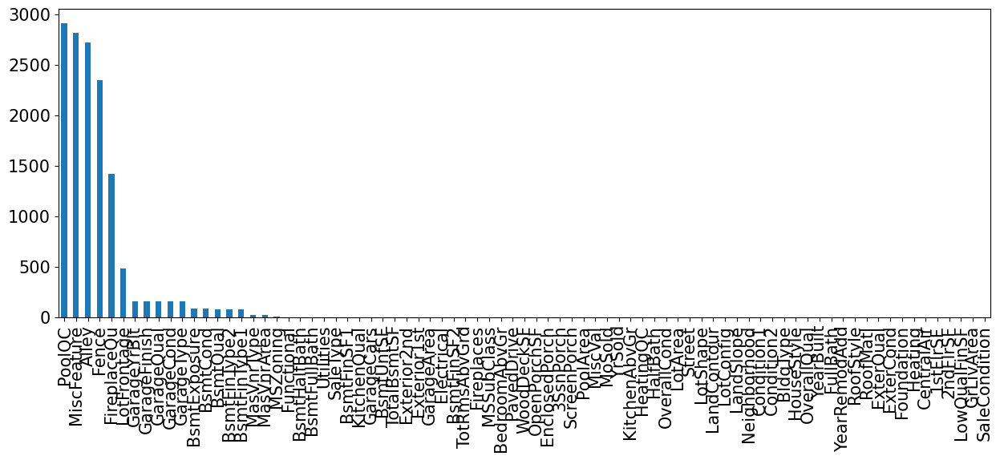

In [95]:
import matplotlib.pyplot as plt
import missingno as msno

missing = all_data.isnull().sum()
#missing = missing[missing &amp;amp;gt; 0]
missing.sort_values(inplace=True,ascending = False)
plt.subplots(figsize=(15,5)) # 設定畫面大小
missing.plot.bar()
plt.show()

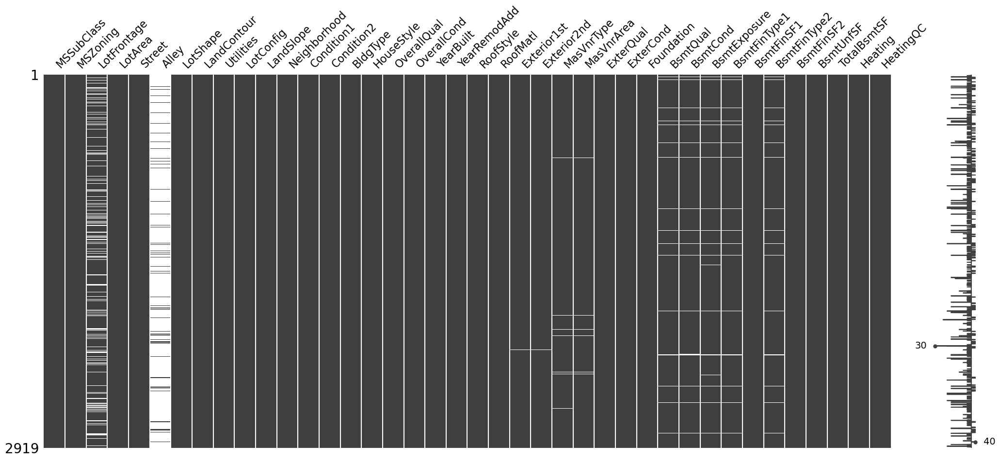

In [96]:
msno.matrix(all_data.iloc[:,:40])
plt.show()

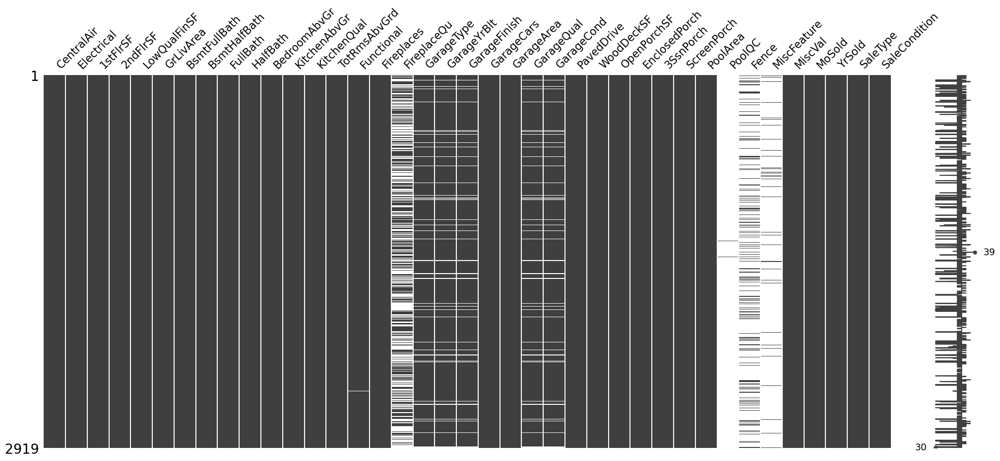

In [97]:
msno.matrix(all_data.iloc[:,40:])
plt.show()

In [98]:
all_data.isnull().sum().sort_values(ascending = False).head(35)

PoolQC          2909
MiscFeature     2814
Alley           2721
Fence           2348
FireplaceQu     1420
LotFrontage      486
GarageYrBlt      159
GarageFinish     159
GarageQual       159
GarageCond       159
GarageType       157
BsmtExposure      82
BsmtCond          82
BsmtQual          81
BsmtFinType2      80
BsmtFinType1      79
MasVnrType        24
MasVnrArea        23
MSZoning           4
Functional         2
BsmtHalfBath       2
BsmtFullBath       2
Utilities          2
SaleType           1
BsmtFinSF1         1
KitchenQual        1
GarageCars         1
BsmtUnfSF          1
TotalBsmtSF        1
Exterior2nd        1
Exterior1st        1
GarageArea         1
Electrical         1
BsmtFinSF2         1
TotRmsAbvGrd       0
dtype: int64

In [99]:
null_rate = all_data.isnull().sum() / len(all_data) *100
null_rate.sort_values(ascending = False).head(35)

PoolQC          99.657417
MiscFeature     96.402878
Alley           93.216855
Fence           80.438506
FireplaceQu     48.646797
LotFrontage     16.649538
GarageYrBlt      5.447071
GarageFinish     5.447071
GarageQual       5.447071
GarageCond       5.447071
GarageType       5.378554
BsmtExposure     2.809181
BsmtCond         2.809181
BsmtQual         2.774923
BsmtFinType2     2.740665
BsmtFinType1     2.706406
MasVnrType       0.822199
MasVnrArea       0.787941
MSZoning         0.137033
Functional       0.068517
BsmtHalfBath     0.068517
BsmtFullBath     0.068517
Utilities        0.068517
SaleType         0.034258
BsmtFinSF1       0.034258
KitchenQual      0.034258
GarageCars       0.034258
BsmtUnfSF        0.034258
TotalBsmtSF      0.034258
Exterior2nd      0.034258
Exterior1st      0.034258
GarageArea       0.034258
Electrical       0.034258
BsmtFinSF2       0.034258
TotRmsAbvGrd     0.000000
dtype: float64

In [115]:
sector = all_data.groupby("Neighborhood").size()
print(sector)

Neighborhood
Blmngtn     28
Blueste     10
BrDale      30
BrkSide    108
ClearCr     44
CollgCr    267
Crawfor    103
Edwards    194
Gilbert    165
IDOTRR      93
MeadowV     37
Mitchel    114
NAmes      443
NPkVill     23
NWAmes     131
NoRidge     71
NridgHt    166
OldTown    239
SWISU       48
Sawyer     151
SawyerW    125
Somerst    182
StoneBr     51
Timber      72
Veenker     24
dtype: int64


In [68]:
#PoolQC:游泳池等級,MiscFeature:其他類別未涵蓋的其他功能,Alley:胡同類型,Fence:圍欄等級,FireplaceQu:壁爐等級
for col in ("PoolQC","MiscFeature","Alley","Fence","FireplaceQu"):
    all_data[col] = all_data[col].fillna("None")

In [69]:
#LotFrontage:與房子相連的街道距離，可能與同區域間的房子相似，所以拿Neighborhood同區的中位數當作替代值
all_data["LotFrontage"] = all_data.groupby("Neighborhood")["LotFrontage"].transform(lambda x: x.fillna(x.median()))

In [70]:
#GarageCond:車庫條件,GarageQual:車庫等級,GarageFinish:車庫內部裝潢,GarageType:車庫位置
for col in ("GarageCond","GarageQual","GarageFinish","GarageType"):
    all_data[col] = all_data[col].fillna("None")

In [72]:
#GarageYrBlt:車庫建照年份,GarageArea:車庫面積,GarageCars:車庫可容納車子的數量(為數值，所以缺值直接補0)
for col in ("GarageYrBlt","GarageArea","GarageCars"):
    all_data[col] = all_data[col].fillna(0)

In [73]:
#BsmtCond : 地下室的狀況,BsmtExposure:地下室採光程度,BsmtQual:地下室高度,BsmtFinType1:地下室1的等級,BsmtFinType2:地下室2的等級
for col in ("BsmtCond","BsmtExposure","BsmtQual","BsmtFinType1","BsmtFinType2"):
    all_data[col] = all_data[col].fillna("None")
#BsmtFinSF1:地下室1的面積,BsmtFinSF2:地下室2的面積,BsmtHalfBath:地下室半浴室數量,BsmtFullBath:地下室全浴室數量,BsmtUnfSF:未完成的地下室面積,TotalBsmtSF:地下室總面積(為數值，所以缺值直接補0)
for col in ("BsmtFinSF1","BsmtFinSF2","BsmtHalfBath","BsmtFullBath","BsmtUnfSF","TotalBsmtSF",):
    all_data[col] = all_data[col].fillna(0)

In [74]:
#MasVnrType:砌體材質
all_data["MasVnrType"] = all_data["MasVnrType"].fillna("None")
#MasVnrArea:砌體面積
all_data["MasVnrArea"] = all_data["MasVnrArea"].fillna(0)

In [75]:
#MSZoning:銷售的住宅類型，正常應該要有值，所以這裡應該是真的遺漏掉的值，並非沒有的狀況，所以拿最多的RL(低密度住宅區)來代替
all_data["MSZoning"] = all_data["MSZoning"].fillna(all_data["MSZoning"].mode()[0])

In [76]:
#Utilities:水電等公共設施種類，雖然公共設施越多應該要月貴，但該特徵值除了1個NoSeWa以及2個nan外，其餘都是AllPub，而NoSeWa正好又在訓練集，對於我們預測的數據沒有幫助，所以可以直接刪除這個特徵值
all_data =  all_data.drop(["Utilities"],axis=1) 

In [77]:
#Functional:家電功能等級，Typ為典型的，也就是一般的，所以2個缺值的部分可以補成Typ
all_data["Functional"] = all_data["Functional"].fillna("Typ")

In [85]:
#Exterior1st,Exterior2nd:房屋外牆飾面，只有1個缺值，所以用最多的數值補
all_data["Exterior1st"] = all_data["Exterior1st"].fillna(all_data["Exterior1st"].mode()[0])
all_data["Exterior2nd"]= all_data["Exterior2nd"].fillna(all_data["Exterior2nd"].mode()[0])

#SaleType:銷售類型，缺值一樣只有一個，所以用最普遍的WD(常規的契約)來替補
all_data["SaleType"] = all_data["SaleType"].fillna(all_data["SaleType"].mode()[0])

#Electrical:電力系統，缺值只有一個，所有用最普遍的SBrkr(標準的電力系統)來替補
all_data["Electrical"] = all_data["Electrical"].fillna(all_data["Electrical"].mode()[0])


#KitchenQual:廚房等級，缺值只有一個，所以用最普遍的TA(典型(中等)的等級)來替補
all_data["KitchenQual"] = all_data["KitchenQual"].fillna(all_data["KitchenQual"].mode()[0])

In [86]:
all_data.isnull().sum().sort_values(ascending = False)

MSSubClass       0
BedroomAbvGr     0
GarageType       0
FireplaceQu      0
Fireplaces       0
Functional       0
TotRmsAbvGrd     0
KitchenQual      0
KitchenAbvGr     0
HalfBath         0
GarageFinish     0
FullBath         0
BsmtHalfBath     0
BsmtFullBath     0
GrLivArea        0
LowQualFinSF     0
2ndFlrSF         0
1stFlrSF         0
GarageYrBlt      0
GarageCars       0
MSZoning         0
PoolArea         0
SaleType         0
YrSold           0
MoSold           0
MiscVal          0
MiscFeature      0
Fence            0
PoolQC           0
ScreenPorch      0
GarageArea       0
3SsnPorch        0
EnclosedPorch    0
OpenPorchSF      0
WoodDeckSF       0
PavedDrive       0
GarageCond       0
GarageQual       0
Electrical       0
CentralAir       0
HeatingQC        0
Neighborhood     0
YearBuilt        0
OverallCond      0
OverallQual      0
HouseStyle       0
BldgType         0
Condition2       0
Condition1       0
LandSlope        0
Heating          0
LotConfig        0
LandContour 

In [87]:
object_feature = all_data[all_data.dtypes[all_data.dtypes == object].index]
train_object = object_feature[:len(train_data)]
train_y = pd.DataFrame(train_data["SalePrice"])
train_y.index = train_data["Id"]
train_object["SalePrice"] = train_y
train_object 

,MSZoning,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,
1,RL,Pave,None,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,...,RFn,TA,TA,Y,None,None,None,WD,Normal,208500
2,RL,Pave,None,Reg,Lvl,FR2,Gtl,Veenker,Feedr,Norm,...,RFn,TA,TA,Y,None,None,None,WD,Normal,181500
3,RL,Pave,None,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm,...,RFn,TA,TA,Y,None,None,None,WD,Normal,223500
4,RL,Pave,None,IR1,Lvl,Corner,Gtl,Crawfor,Norm,Norm,...,Unf,TA,TA,Y,None,None,None,WD,Abnorml,140000
5,RL,Pave,None,IR1,Lvl,FR2,Gtl,NoRidge,Norm,Norm,...,RFn,TA,TA,Y,None,None,None,WD,Normal,250000
6,RL,Pave,None,IR1,Lvl,Inside,Gtl,Mitchel,Norm,Norm,...,Unf,TA,TA,Y,None,MnPrv,Shed,WD,Normal,143000
7,RL,Pave,None,Reg,Lvl,Inside,Gtl,Somerst,Norm,Norm,...,RFn,TA,TA,Y,None,None,None,WD,Normal,307000
8,RL,Pave,None,IR1,Lvl,Corner,Gtl,NWAmes,PosN,Norm,...,RFn,TA,TA,Y,None,None,Shed,WD,Normal,200000
9,RM,Pave,None,Reg,Lvl,Inside,Gtl,OldTown,Artery,Norm,...,Unf,Fa,TA,Y,None,None,None,WD,Abnorml,129900


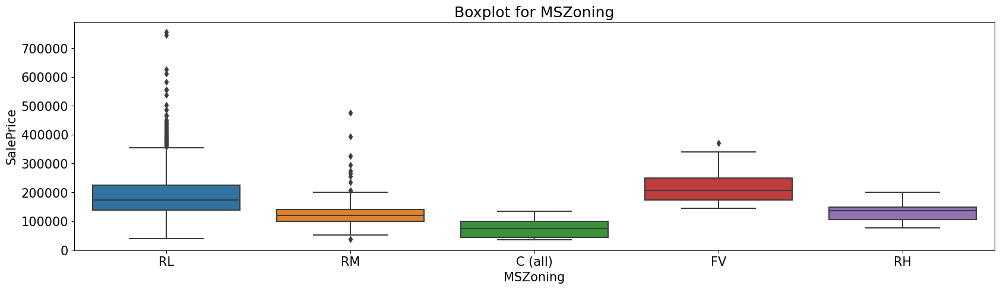

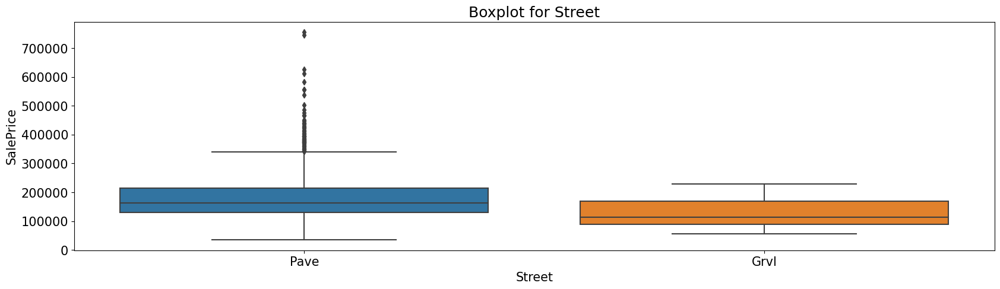

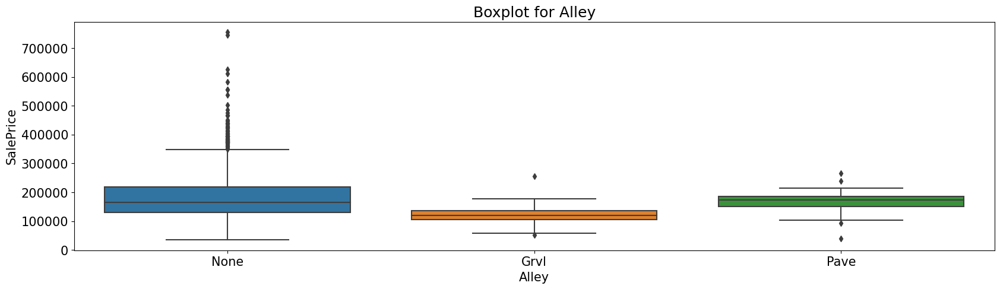

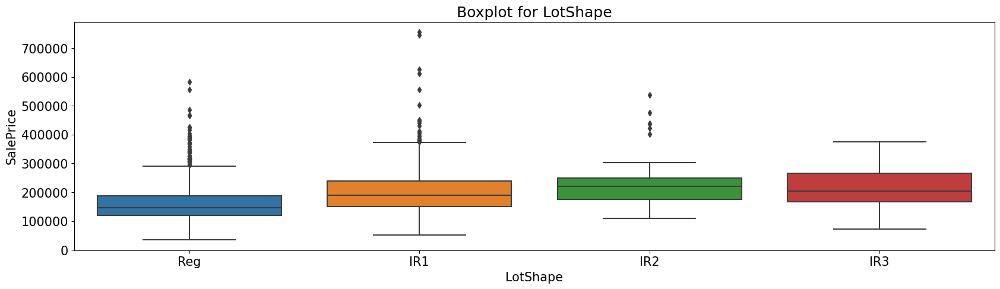

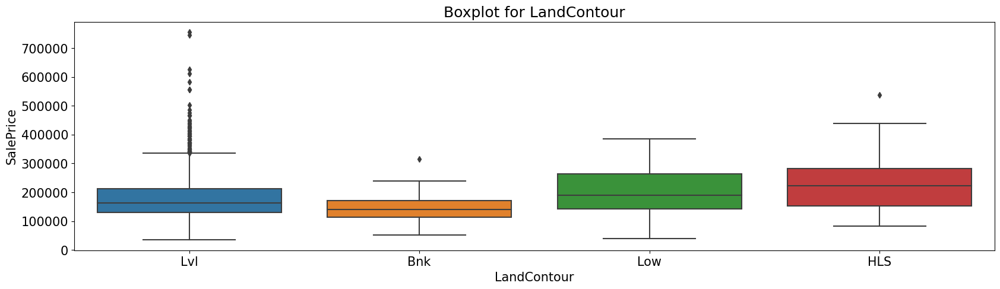

...

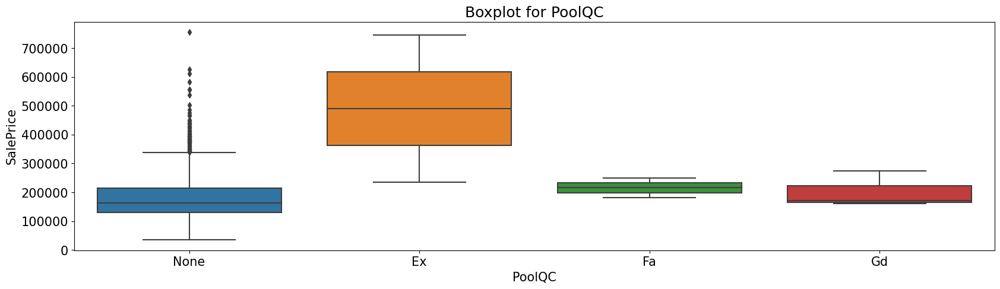

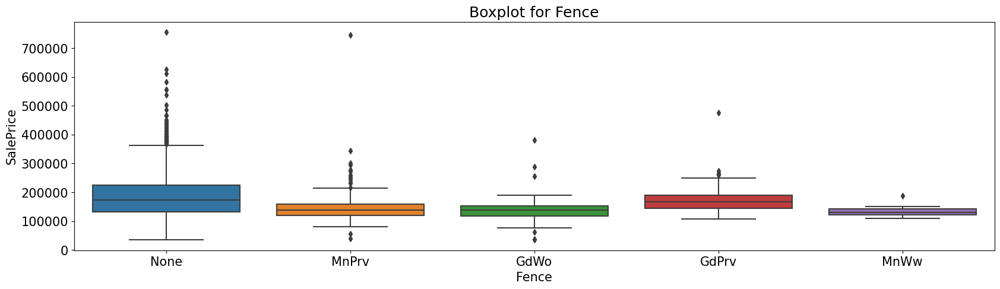

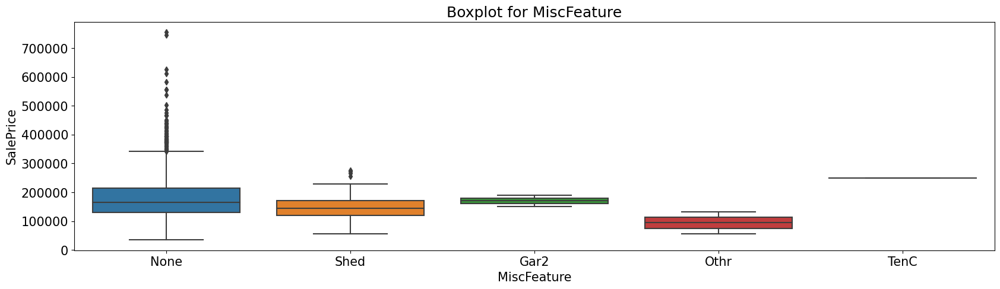

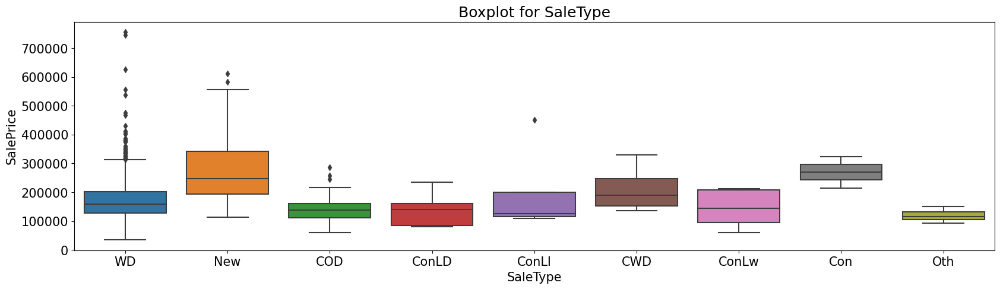

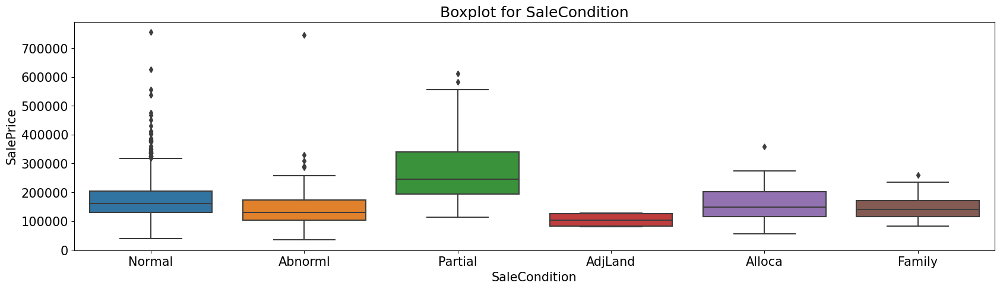

In [89]:
import seaborn as sns

for col in train_object .columns[:-1]:
    plt.subplots(figsize=(20,5))
    sns.boxplot(x=col, y="SalePrice", data=train_object )
    plt.title('Boxplot for {}'.format(col))
    plt.show()

              SalePrice                
                   mean    median count
MSZoning                               
C (all)    74528.000000   74700.0    10
RM        126316.830275  120500.0   218
RH        131558.375000  136500.0    16
RL        191004.994787  174000.0  1151
FV        214014.061538  205950.0    65
            SalePrice                
                 mean    median count
Street                               
Grvl    130190.500000  114250.0     6
Pave    181130.538514  163000.0  1454
           SalePrice                
                mean    median count
Alley                               
Grvl   122219.080000  119500.0    50
None   183452.131483  165000.0  1369
Pave   168000.585366  172500.0    41
              SalePrice                
                   mean    median count
LotShape                               
Reg       164754.818378  146000.0   925
IR1       206101.665289  189000.0   484
IR3       216036.500000  203570.0    10
IR2       239833.365854  221

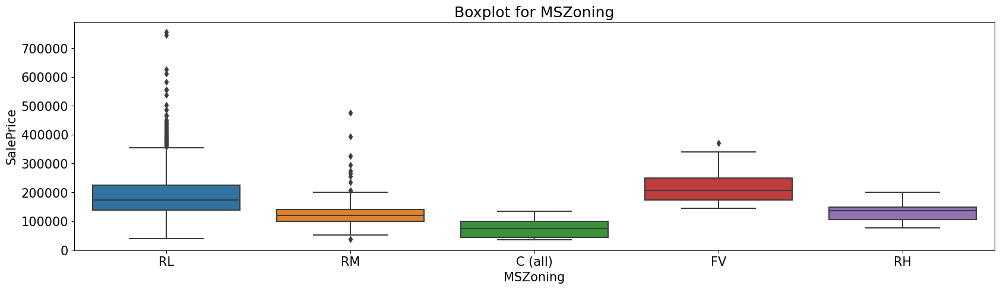

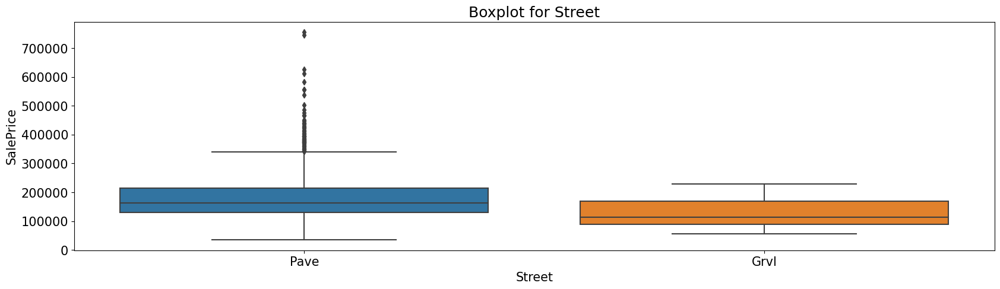

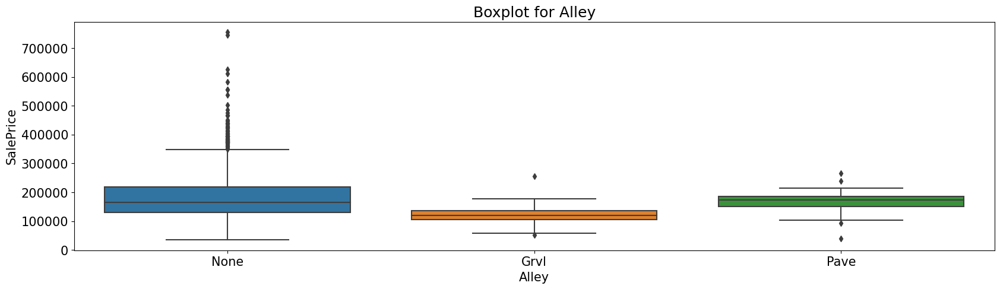

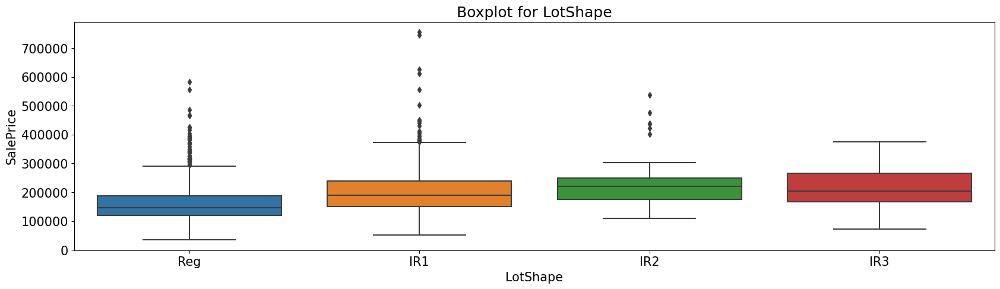

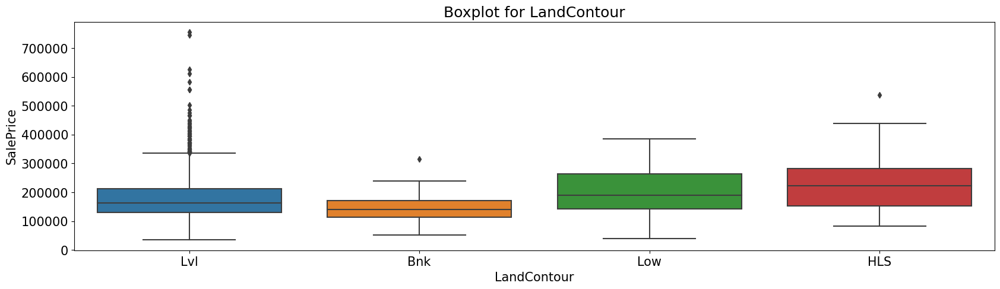

...

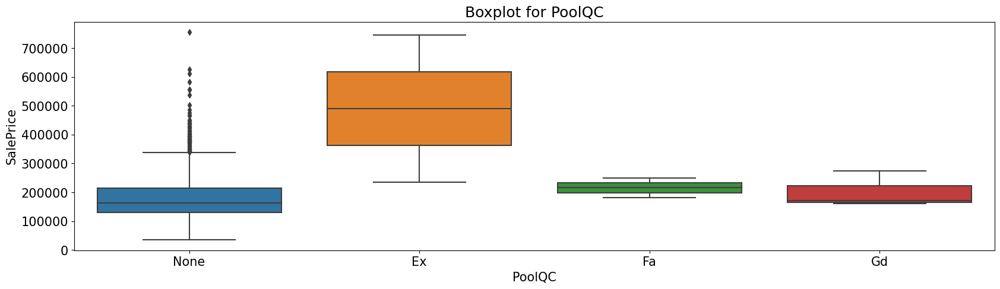

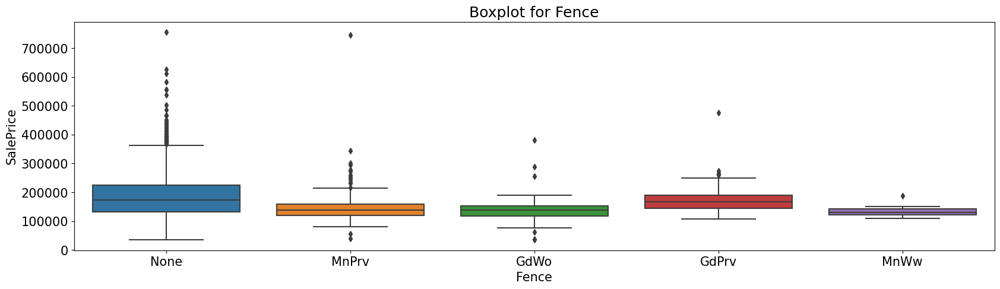

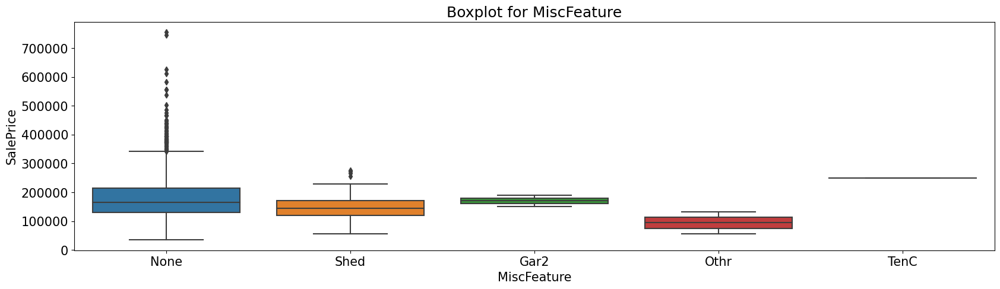

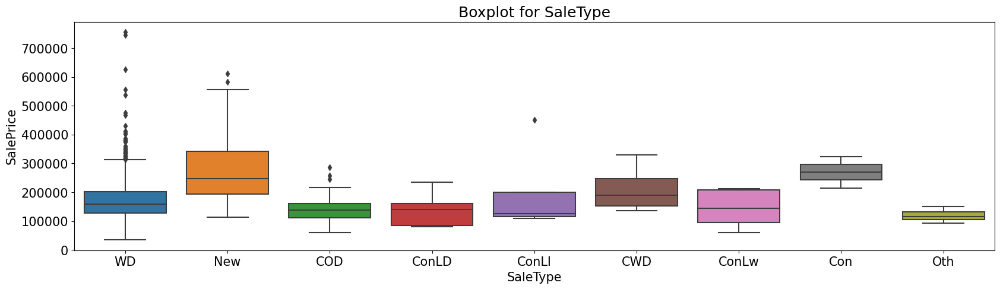

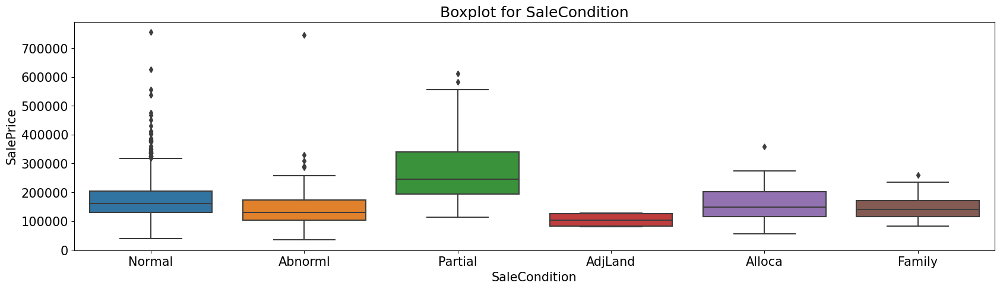

In [93]:
for col in train_object.columns:
    data = train_object.groupby([col])[["SalePrice"]].agg(['mean','median','count'])
    sort_data = data.sort_values(data.columns[1],ascending = True)
    print(sort_data)

for col in train_object .columns[:-1]:
    plt.subplots(figsize=(20,5))
    sns.boxplot(x=col, y="SalePrice", data=train_object )
    plt.title('Boxplot for {}'.format(col))
    plt.show()

In [ ]:


with open('house_predict.csv', 'w') as f: #開啟一個檔案，house_predict.csv是名字；w是寫入
    f.write('id,SalePrice\n') #寫入最上方的列，並用\n往下一列
    for i in range(len(pred)): #len(pred)看整個test有多長，然後用for去跑全部
        f.write(str(i + 1461) + ',' + str(float(pred[i])) + '\n')
        #寫入，這邊特別注意「+1461」，因為它給的sample_submission是從1461開始
        #中間加上逗號是因為前面有介紹過csv檔是以逗號為間隔的檔案
        #str(float(pred[i]):先把它變成浮點數，再用str()把它變回字串
        #後面的'\n'是要換下一列的意思
        #注意到中間全部是用「+號」隔開，這是字串的基本招式唷   

